### 초기 경로 설정 (클래스 이용을 위함)

In [1]:
%cd /project/segmentation/smcho1201/segmentation_project

/project/segmentation/smcho1201/segmentation_project


In [2]:
# files and system
import os
import sys
import time
import random

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import glob
from IPython.display import clear_output
# working with images
import cv2
import imageio
import scipy.ndimage
# import skimage.transform

import torchvision.transforms as transforms

import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F


import torchsummary
from tqdm import notebook

sys.path.insert(0, '..')

# losses
from utils.metrics import iou_pytorch_eval, IoULoss, IoUBCELoss, DiceBCELoss , dice_pytorch_eval
from utils.metrics import iou_pytorch_test, dice_pytorch_test, precision_pytorch_test, recall_pytorch_test, fbeta_pytorch_test, accuracy_pytorch_test

# dataset
from utils.dataset import myDataSet

## 랜덤성을 배제한 환경 고정

In [3]:
random_seed= 42
random.seed(random_seed)
np.random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.backends.cudnn.deterministic = True

In [4]:
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") # select device for training, i.e. gpu or cpu
print(DEVICE)

cuda:0


# 1. Image augentation
> 실험할 때는 아예 augmentation도 고정시켜서 저장한 이미지를 사용해야 함.

In [5]:
_size = 224, 224
resize = transforms.Resize(_size, interpolation=0)

# set your transforms 
train_transforms = transforms.Compose([
                           transforms.Resize(_size, interpolation=0),
                           transforms.RandomRotation(180),
                           transforms.RandomHorizontalFlip(0.5),
                           transforms.RandomCrop(_size, padding = 10), # needed after rotation (with original size)
                       ])

test_transforms = transforms.Compose([
                           transforms.Resize(_size, interpolation=0),
                       ])

/home/smcho1201/.conda/envs/pytorch/lib/python3.9/site-packages/torchvision/transforms/transforms.py:332: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  warnings.warn(


# 2. 데이터셋 클래스 생성
> 해당 클래스는 이용하려는 이미지와 라벨의 모든 경로(/data/segmentation/...)의 리스트를 인자로 받는다.   

In [6]:
train_images = glob.glob('/data/segmentation/Kvasir-SEG/trainset/images/*')
train_labels = glob.glob('/data/segmentation/Kvasir-SEG/trainset/labels/*')
train_images = [img for img in train_images if img.find('jpg')!= -1] # super pixels 이미지 제외

valid_images = glob.glob('/data/segmentation/Kvasir-SEG/validationset/images/*')
valid_labels = glob.glob('/data/segmentation/Kvasir-SEG/validationset/labels/*')
valid_images = [img for img in valid_images if img.find('jpg')!= -1] # super pixels 이미지 제외


train_images = sorted(train_images)
train_labels = sorted(train_labels)

valid_images = sorted(valid_images)
valid_labels = sorted(valid_labels)


custom_dataset_train = myDataSet(train_images, train_labels, transforms=test_transforms)
print("My custom training-dataset has {} elements".format(len(custom_dataset_train)))


custom_dataset_val = myDataSet(valid_images, valid_labels, transforms=test_transforms)
print("My custom valing-dataset has {} elements".format(len(custom_dataset_val)))

My custom training-dataset has 600 elements
My custom valing-dataset has 200 elements


### dataset class check
> RGB 채널 평균 값이라 색 바뀜

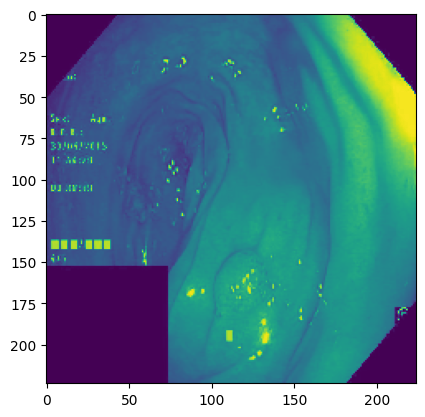

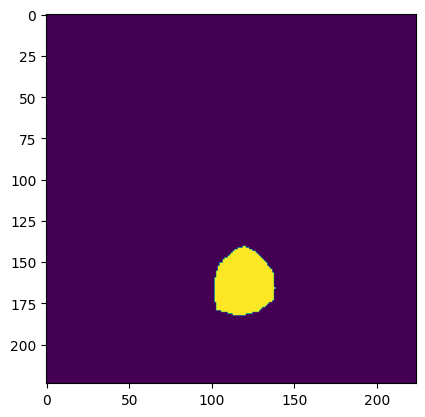

3픽셀의 평균값이라 색깔이 변경됨.


In [7]:
# Show example images.
image_number = 23
img, mask = custom_dataset_train.__getitem__(image_number)

# image
plt.figure()
plt.imshow(img.mean(0)) # 3 channels, take mean

# mask
plt.figure()
plt.imshow(mask[0, :, :]) # 1 channel, take it

plt.show()
print('3픽셀의 평균값이라 색깔이 변경됨.')

# 3. 모델 클래스 생성

In [8]:
# Begin training
from models.FCN.torchvision.models.segmentation.fcn import fcn_resnet101
model = fcn_resnet101(num_classes = 1)
model = model.to(DEVICE) # load model to DEVICE

# 4. 하이퍼 파라미터 세팅 & 데이터 로더 생성

In [9]:
# Define variables for the training
epochs = 100
patience = 20
BATCH_SIZE = 8

dataloader_train = torch.utils.data.DataLoader(custom_dataset_train, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
dataloader_val = torch.utils.data.DataLoader(custom_dataset_val, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

In [10]:
# Define optimiser and criterion for the training. You can try different ones to see which works best for your data and task
optimizer = torch.optim.Adam(model.parameters(), lr = 1e-4, weight_decay = 1e-8)

criterion = DiceBCELoss()
model_name = 'FCN'
data_name = 'Kvasir'

# 5. Training

 Epoch: 1 of 100, Iter.: 75 of 75, Train Loss: 0.745875, IoU: 0.559685, Dice: 0.676364
 Epoch: 1 of 100, Iter.: 75 of 75, Valid Loss: 0.482548, IoU: 0.681063, Dice: 0.782720

시각화되는 이미지는 1.실제 테스트 이미지 2.실제 라벨 이미지 3.예측 라벨 4.예측한 이미지 결과의 순서입니다.


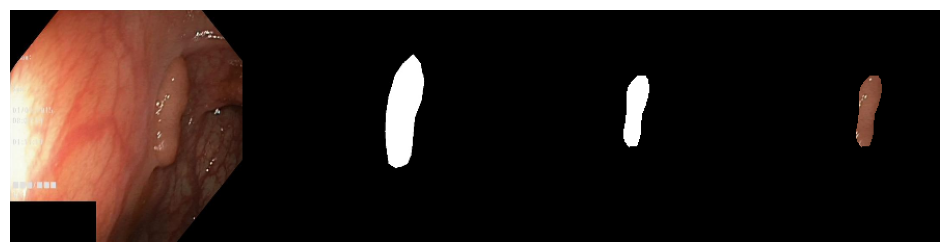

 Epoch: 2 of 100, Iter.: 75 of 75, Train Loss: 0.339571, IoU: 0.758536, Dice: 0.847199
 Epoch: 2 of 100, Iter.: 75 of 75, Valid Loss: 0.361945, IoU: 0.750526, Dice: 0.836247


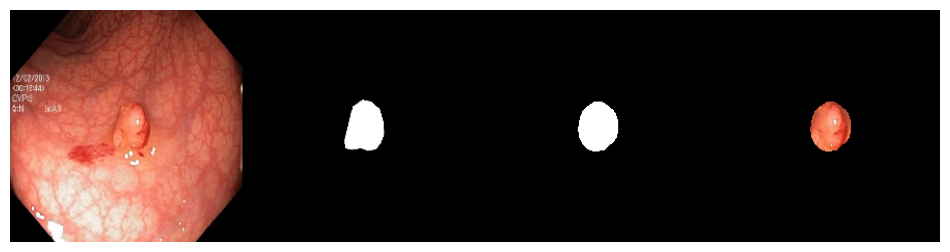

 Epoch: 3 of 100, Iter.: 75 of 75, Train Loss: 0.222616, IoU: 0.820764, Dice: 0.892303
 Epoch: 3 of 100, Iter.: 75 of 75, Valid Loss: 0.350915, IoU: 0.753355, Dice: 0.839482


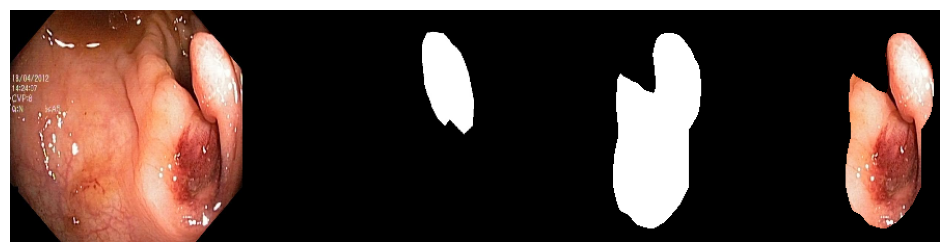

 Epoch: 4 of 100, Iter.: 75 of 75, Train Loss: 0.183219, IoU: 0.838723, Dice: 0.902692
 Epoch: 4 of 100, Iter.: 75 of 75, Valid Loss: 0.384676, IoU: 0.760730, Dice: 0.840249


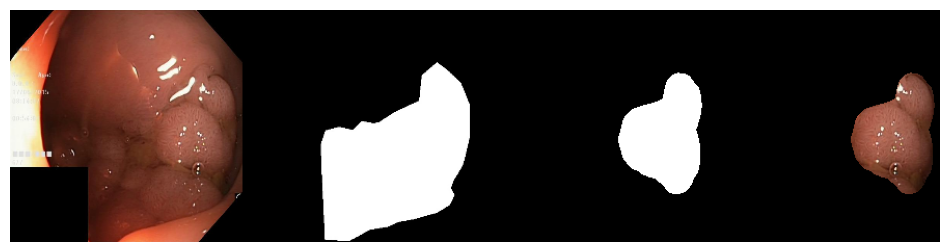

 Epoch: 5 of 100, Iter.: 75 of 75, Train Loss: 0.156243, IoU: 0.857001, Dice: 0.915947
 Epoch: 5 of 100, Iter.: 75 of 75, Valid Loss: 0.343411, IoU: 0.765198, Dice: 0.844875


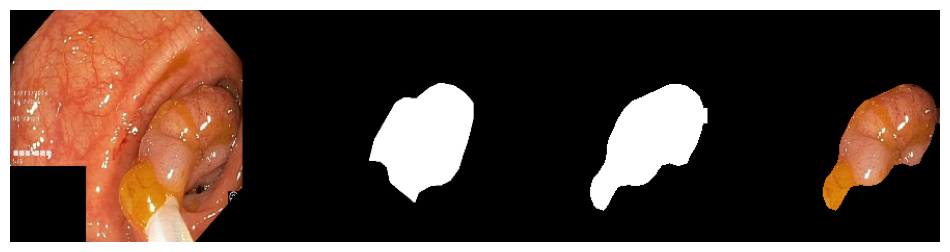

 Epoch: 6 of 100, Iter.: 75 of 75, Train Loss: 0.130484, IoU: 0.874966, Dice: 0.926370
 Epoch: 6 of 100, Iter.: 75 of 75, Valid Loss: 0.328287, IoU: 0.759059, Dice: 0.838569


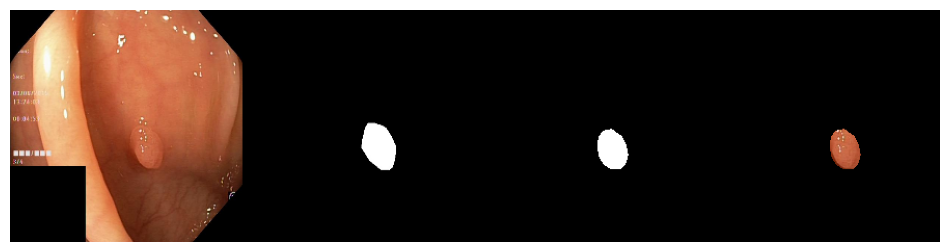

 Epoch: 7 of 100, Iter.: 75 of 75, Train Loss: 0.098564, IoU: 0.897713, Dice: 0.941817
 Epoch: 7 of 100, Iter.: 75 of 75, Valid Loss: 0.332479, IoU: 0.773009, Dice: 0.849461


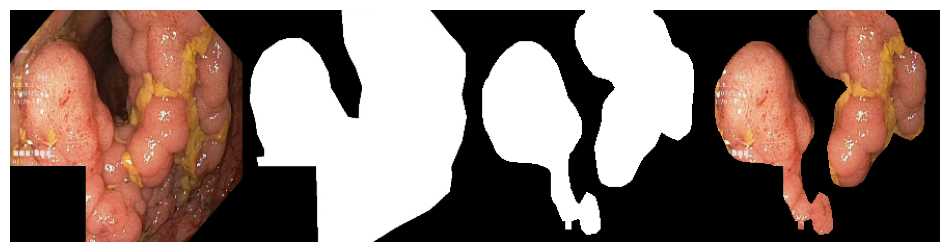

 Epoch: 8 of 100, Iter.: 75 of 75, Train Loss: 0.107473, IoU: 0.894406, Dice: 0.937167
 Epoch: 8 of 100, Iter.: 75 of 75, Valid Loss: 0.400997, IoU: 0.770885, Dice: 0.847804


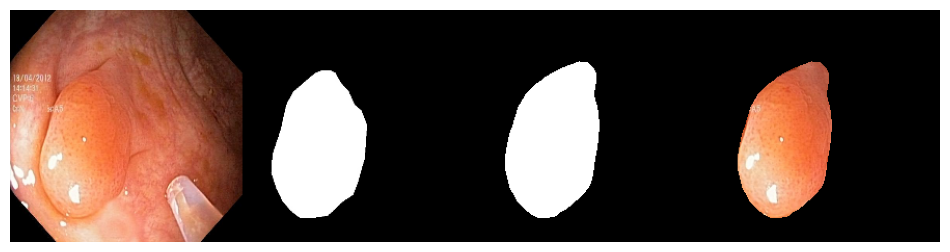

 Epoch: 9 of 100, Iter.: 75 of 75, Train Loss: 0.093404, IoU: 0.899357, Dice: 0.943091
 Epoch: 9 of 100, Iter.: 75 of 75, Valid Loss: 0.348462, IoU: 0.768191, Dice: 0.840809


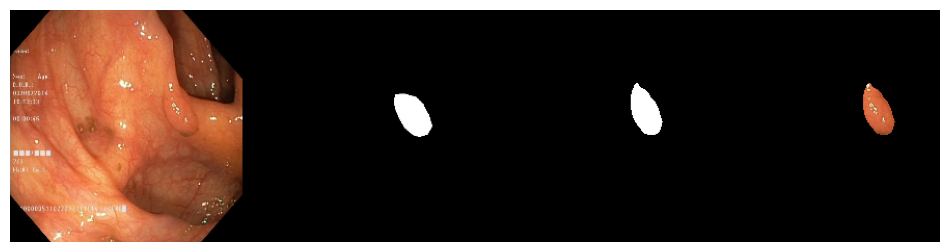

 Epoch: 10 of 100, Iter.: 75 of 75, Train Loss: 0.075928, IoU: 0.915276, Dice: 0.953020
 Epoch: 10 of 100, Iter.: 75 of 75, Valid Loss: 0.309627, IoU: 0.795047, Dice: 0.863949


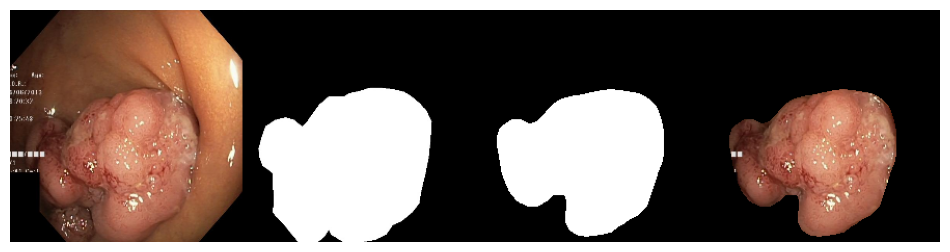

 Epoch: 11 of 100, Iter.: 75 of 75, Train Loss: 0.086765, IoU: 0.911950, Dice: 0.949492
 Epoch: 11 of 100, Iter.: 75 of 75, Valid Loss: 0.381609, IoU: 0.767348, Dice: 0.844256


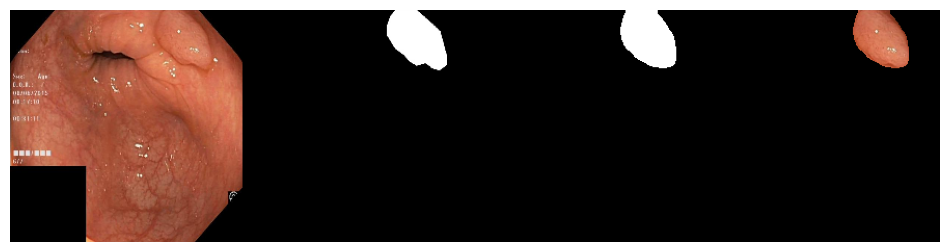

 Epoch: 12 of 100, Iter.: 75 of 75, Train Loss: 0.101579, IoU: 0.898308, Dice: 0.942536
 Epoch: 12 of 100, Iter.: 75 of 75, Valid Loss: 0.381631, IoU: 0.764757, Dice: 0.846388


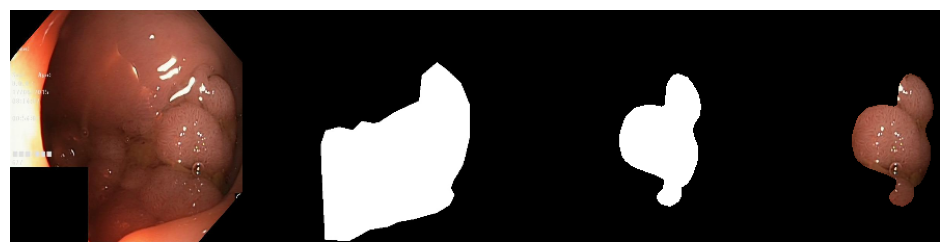

 Epoch: 13 of 100, Iter.: 75 of 75, Train Loss: 0.133096, IoU: 0.875541, Dice: 0.926755
 Epoch: 13 of 100, Iter.: 75 of 75, Valid Loss: 0.435274, IoU: 0.715036, Dice: 0.787919


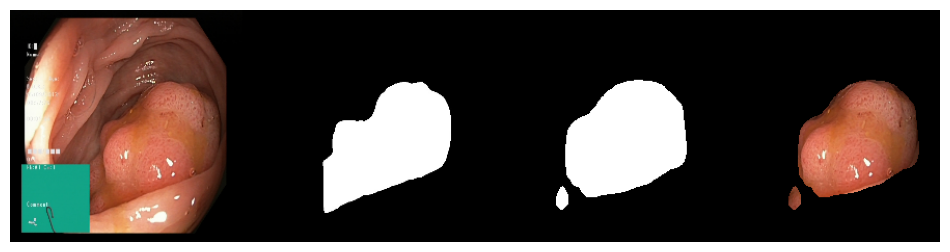

 Epoch: 14 of 100, Iter.: 75 of 75, Train Loss: 0.110295, IoU: 0.891095, Dice: 0.937908
 Epoch: 14 of 100, Iter.: 75 of 75, Valid Loss: 0.444271, IoU: 0.735328, Dice: 0.817684


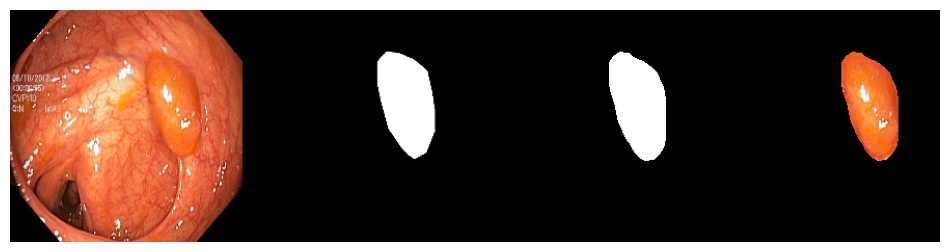

 Epoch: 15 of 100, Iter.: 75 of 75, Train Loss: 0.083109, IoU: 0.908059, Dice: 0.948274
 Epoch: 15 of 100, Iter.: 75 of 75, Valid Loss: 0.366596, IoU: 0.767165, Dice: 0.843862


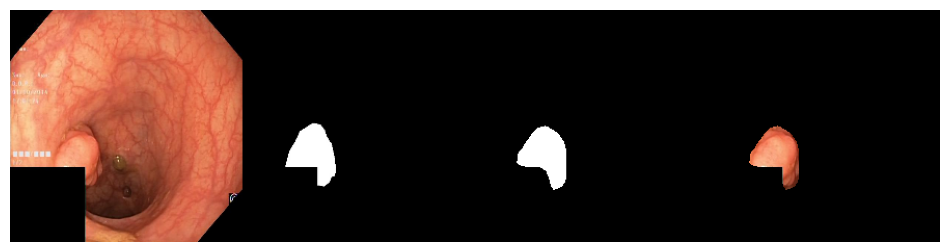

 Epoch: 16 of 100, Iter.: 75 of 75, Train Loss: 0.062878, IoU: 0.925219, Dice: 0.959559
 Epoch: 16 of 100, Iter.: 75 of 75, Valid Loss: 0.374843, IoU: 0.778748, Dice: 0.847063


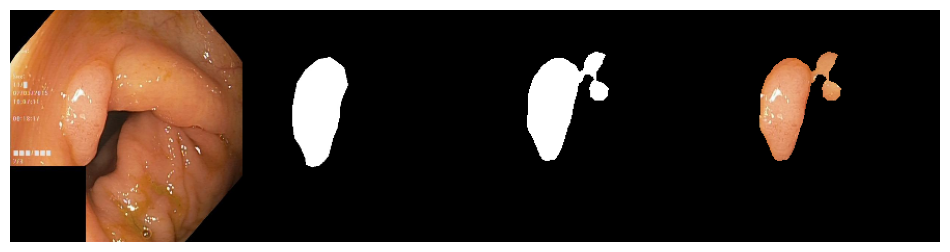

 Epoch: 17 of 100, Iter.: 75 of 75, Train Loss: 0.062543, IoU: 0.929673, Dice: 0.961229
 Epoch: 17 of 100, Iter.: 75 of 75, Valid Loss: 0.361951, IoU: 0.777877, Dice: 0.849055


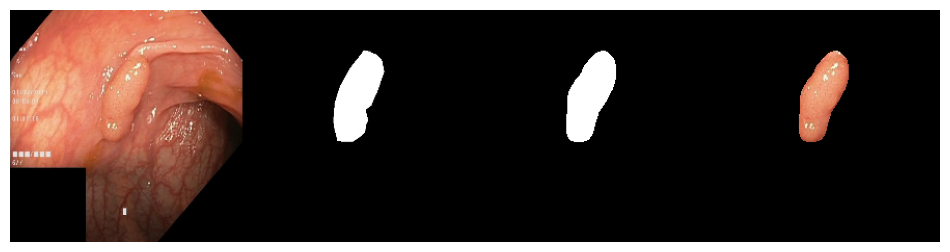

 Epoch: 18 of 100, Iter.: 75 of 75, Train Loss: 0.052857, IoU: 0.936025, Dice: 0.965239
 Epoch: 18 of 100, Iter.: 75 of 75, Valid Loss: 0.335457, IoU: 0.793804, Dice: 0.865988


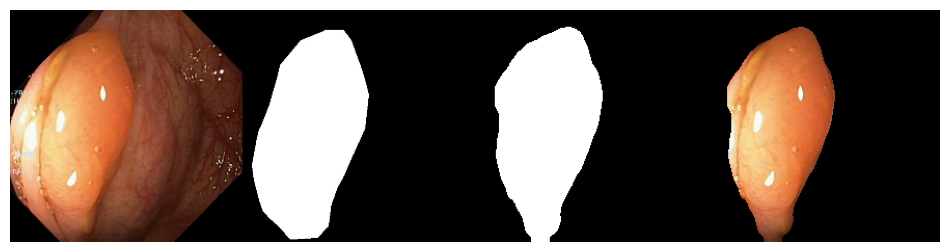

 Epoch: 19 of 100, Iter.: 75 of 75, Train Loss: 0.045967, IoU: 0.944298, Dice: 0.970444
 Epoch: 19 of 100, Iter.: 75 of 75, Valid Loss: 0.337590, IoU: 0.796649, Dice: 0.864941


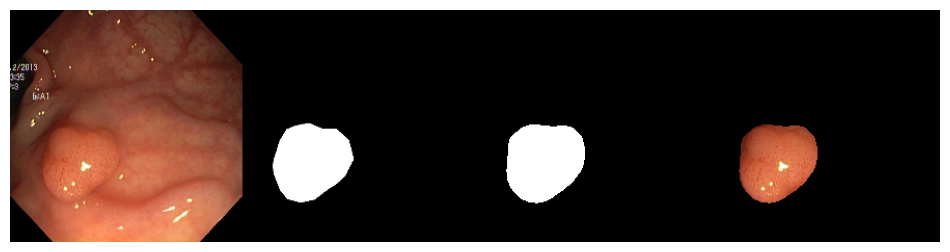

 Epoch: 20 of 100, Iter.: 75 of 75, Train Loss: 0.040247, IoU: 0.951048, Dice: 0.974359
 Epoch: 20 of 100, Iter.: 75 of 75, Valid Loss: 0.347576, IoU: 0.798358, Dice: 0.866327


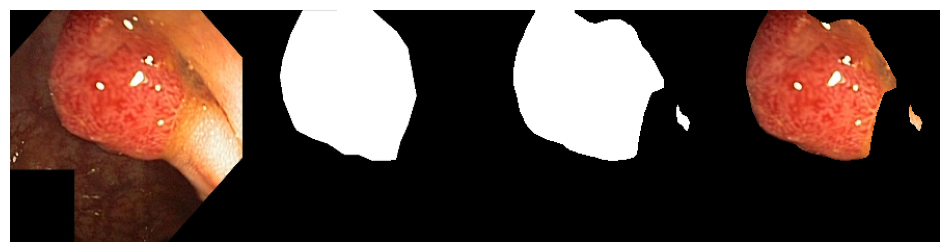

 Epoch: 21 of 100, Iter.: 75 of 75, Train Loss: 0.037615, IoU: 0.954148, Dice: 0.976027
 Epoch: 21 of 100, Iter.: 75 of 75, Valid Loss: 0.363440, IoU: 0.796602, Dice: 0.864015


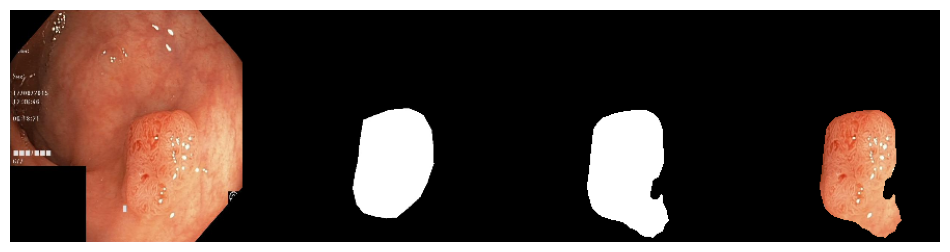

 Epoch: 22 of 100, Iter.: 75 of 75, Train Loss: 0.036635, IoU: 0.955063, Dice: 0.976504
 Epoch: 22 of 100, Iter.: 75 of 75, Valid Loss: 0.382486, IoU: 0.781452, Dice: 0.850845


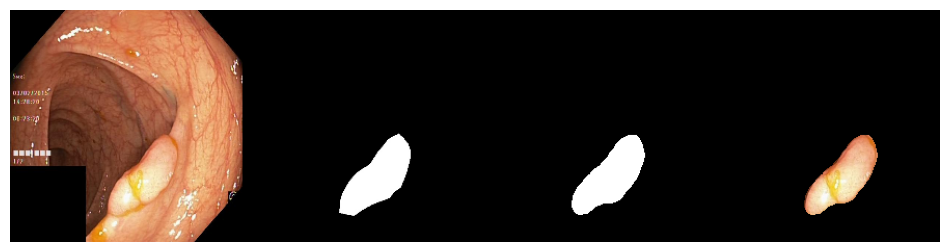

 Epoch: 23 of 100, Iter.: 75 of 75, Train Loss: 0.034425, IoU: 0.957657, Dice: 0.977911
 Epoch: 23 of 100, Iter.: 75 of 75, Valid Loss: 0.369870, IoU: 0.788733, Dice: 0.856414


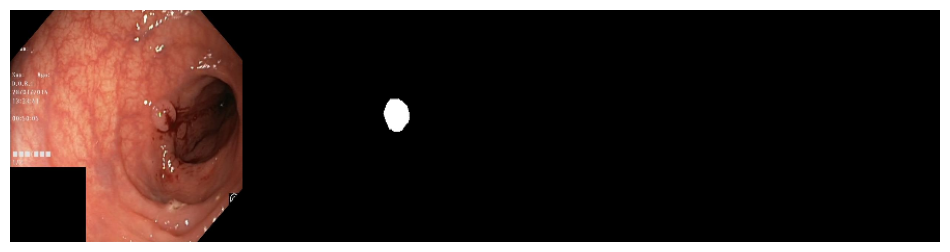

 Epoch: 24 of 100, Iter.: 75 of 75, Train Loss: 0.032028, IoU: 0.959658, Dice: 0.979029
 Epoch: 24 of 100, Iter.: 75 of 75, Valid Loss: 0.377390, IoU: 0.795025, Dice: 0.863312


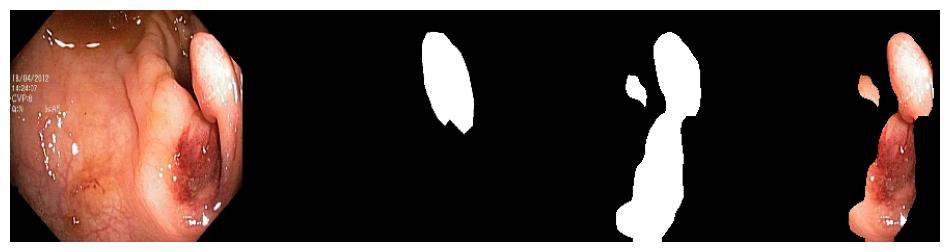

 Epoch: 25 of 100, Iter.: 75 of 75, Train Loss: 0.030632, IoU: 0.961705, Dice: 0.980127
 Epoch: 25 of 100, Iter.: 75 of 75, Valid Loss: 0.371407, IoU: 0.794252, Dice: 0.864149


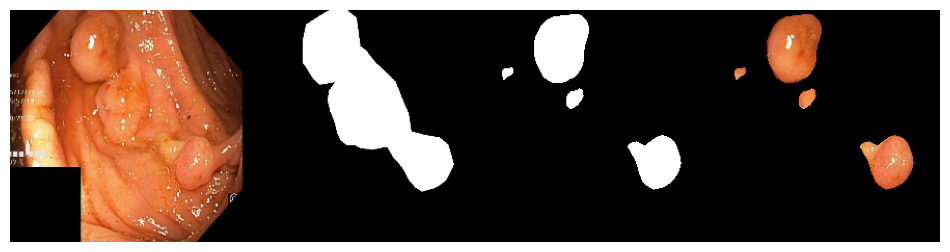

 Epoch: 26 of 100, Iter.: 75 of 75, Train Loss: 0.029269, IoU: 0.963633, Dice: 0.981203
 Epoch: 26 of 100, Iter.: 75 of 75, Valid Loss: 0.380412, IoU: 0.798263, Dice: 0.870005


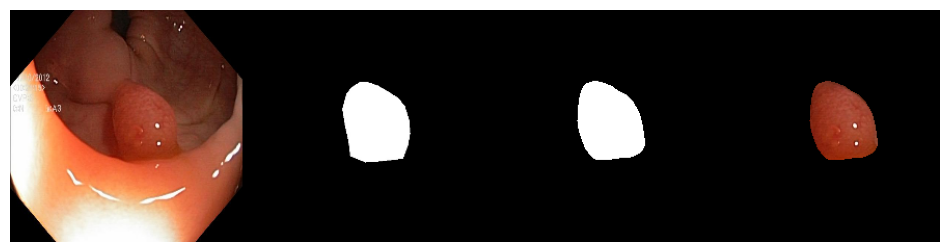

 Epoch: 27 of 100, Iter.: 75 of 75, Train Loss: 0.028400, IoU: 0.964489, Dice: 0.981651
 Epoch: 27 of 100, Iter.: 75 of 75, Valid Loss: 0.366869, IoU: 0.803356, Dice: 0.871919


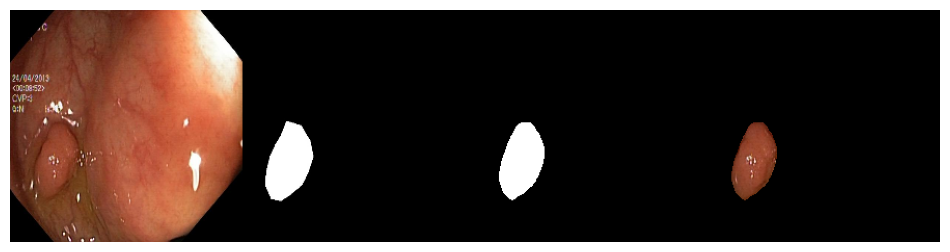

 Epoch: 28 of 100, Iter.: 75 of 75, Train Loss: 0.027280, IoU: 0.966030, Dice: 0.982466
 Epoch: 28 of 100, Iter.: 75 of 75, Valid Loss: 0.372115, IoU: 0.805144, Dice: 0.873220


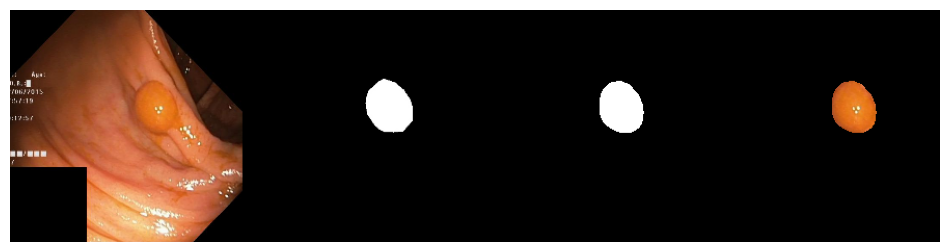

 Epoch: 29 of 100, Iter.: 75 of 75, Train Loss: 0.025325, IoU: 0.967748, Dice: 0.983337
 Epoch: 29 of 100, Iter.: 75 of 75, Valid Loss: 0.387525, IoU: 0.801720, Dice: 0.870386


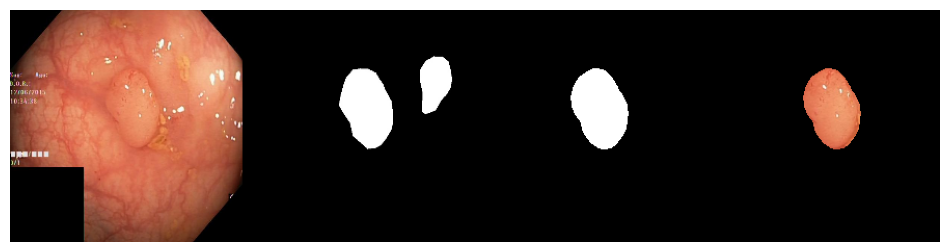

 Epoch: 30 of 100, Iter.: 75 of 75, Train Loss: 0.024666, IoU: 0.968076, Dice: 0.983074
 Epoch: 30 of 100, Iter.: 75 of 75, Valid Loss: 0.392886, IoU: 0.806670, Dice: 0.875154


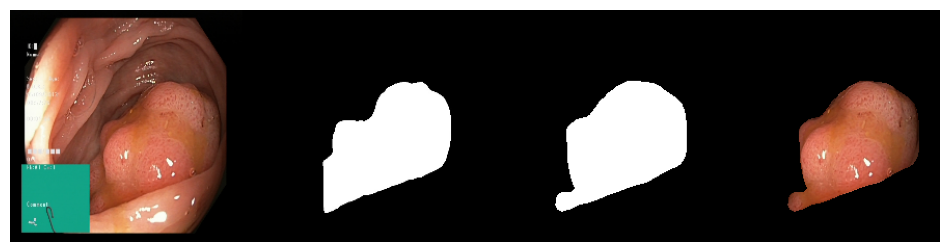

 Epoch: 31 of 100, Iter.: 75 of 75, Train Loss: 0.024127, IoU: 0.969494, Dice: 0.984240
 Epoch: 31 of 100, Iter.: 75 of 75, Valid Loss: 0.385041, IoU: 0.804173, Dice: 0.872762


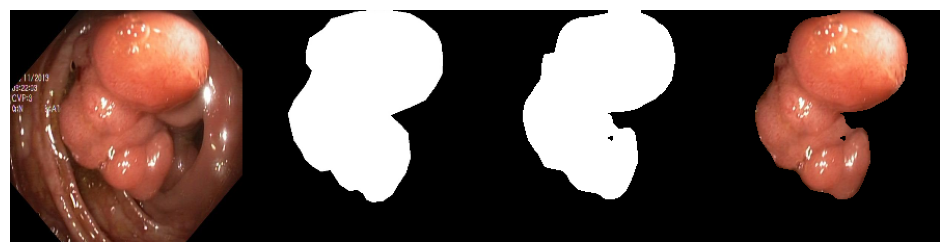

 Epoch: 32 of 100, Iter.: 75 of 75, Train Loss: 0.023096, IoU: 0.970845, Dice: 0.985046
 Epoch: 32 of 100, Iter.: 75 of 75, Valid Loss: 0.396204, IoU: 0.804973, Dice: 0.873301


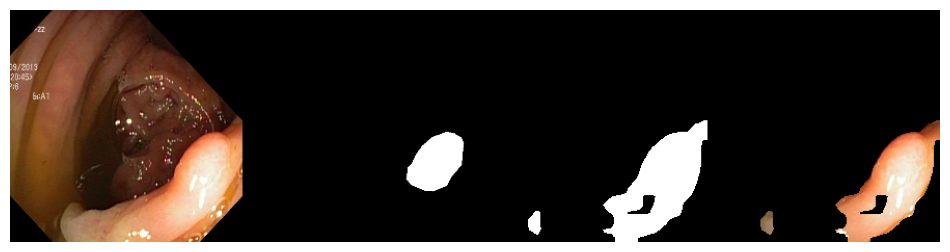

 Epoch: 33 of 100, Iter.: 75 of 75, Train Loss: 0.022257, IoU: 0.971681, Dice: 0.985436
 Epoch: 33 of 100, Iter.: 75 of 75, Valid Loss: 0.405997, IoU: 0.806020, Dice: 0.874472


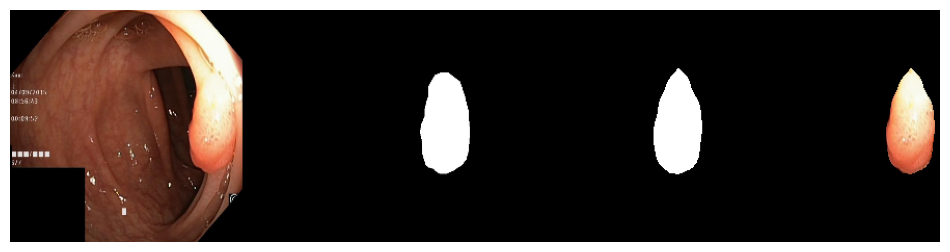

 Epoch: 34 of 100, Iter.: 75 of 75, Train Loss: 0.021867, IoU: 0.972060, Dice: 0.985700
 Epoch: 34 of 100, Iter.: 75 of 75, Valid Loss: 0.408349, IoU: 0.805733, Dice: 0.873533


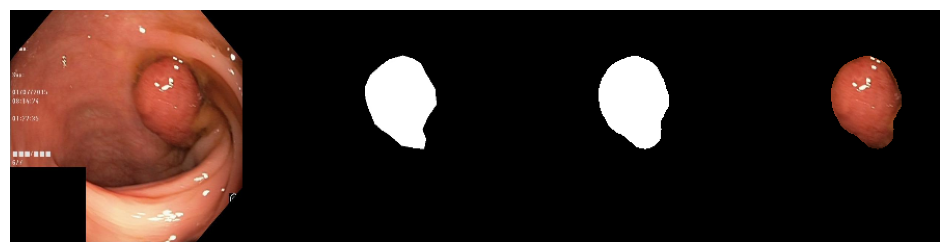

 Epoch: 35 of 100, Iter.: 75 of 75, Train Loss: 0.022462, IoU: 0.970564, Dice: 0.984906
 Epoch: 35 of 100, Iter.: 75 of 75, Valid Loss: 0.418030, IoU: 0.802023, Dice: 0.870754


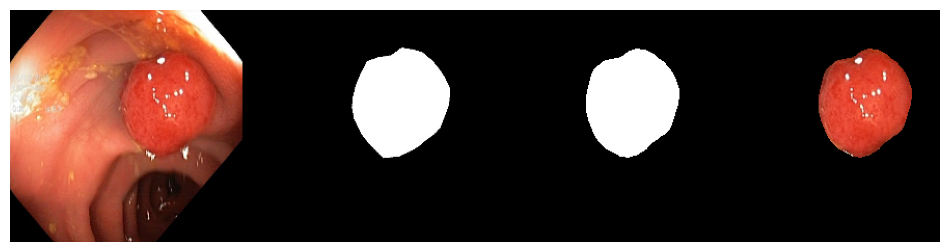

 Epoch: 36 of 100, Iter.: 75 of 75, Train Loss: 0.022673, IoU: 0.970380, Dice: 0.984801
 Epoch: 36 of 100, Iter.: 75 of 75, Valid Loss: 0.416461, IoU: 0.804869, Dice: 0.873378


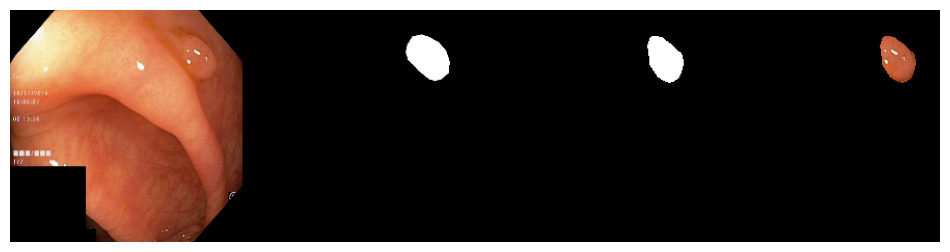

 Epoch: 37 of 100, Iter.: 75 of 75, Train Loss: 0.022528, IoU: 0.970260, Dice: 0.984654
 Epoch: 37 of 100, Iter.: 75 of 75, Valid Loss: 0.402323, IoU: 0.809010, Dice: 0.874663


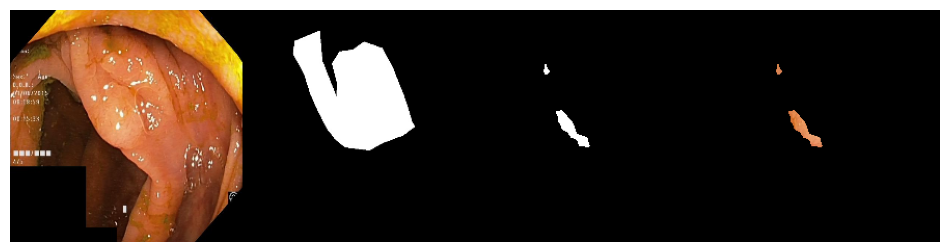

 Epoch: 38 of 100, Iter.: 75 of 75, Train Loss: 0.021167, IoU: 0.971904, Dice: 0.985448
 Epoch: 38 of 100, Iter.: 75 of 75, Valid Loss: 0.420725, IoU: 0.807891, Dice: 0.874719


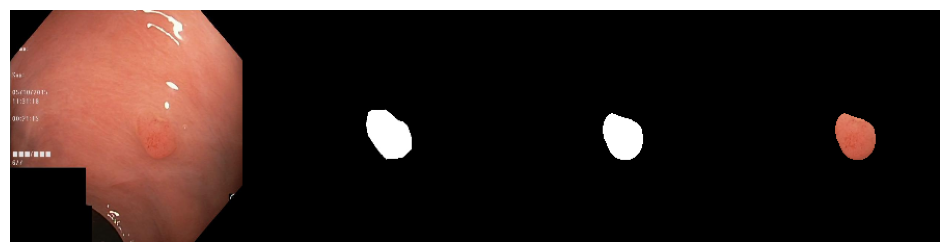

 Epoch: 39 of 100, Iter.: 75 of 75, Train Loss: 0.020240, IoU: 0.973727, Dice: 0.986534
 Epoch: 39 of 100, Iter.: 75 of 75, Valid Loss: 0.415401, IoU: 0.810037, Dice: 0.876307


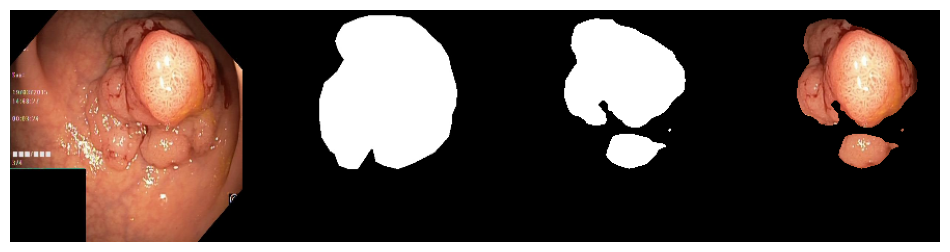

 Epoch: 40 of 100, Iter.: 75 of 75, Train Loss: 0.019435, IoU: 0.974339, Dice: 0.986812
 Epoch: 40 of 100, Iter.: 75 of 75, Valid Loss: 0.425791, IoU: 0.810033, Dice: 0.877668


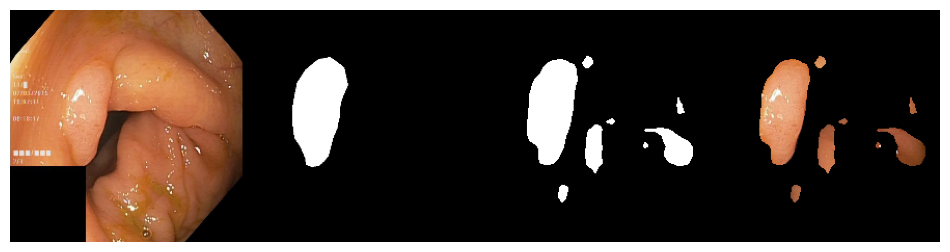

 Epoch: 41 of 100, Iter.: 75 of 75, Train Loss: 0.019344, IoU: 0.975392, Dice: 0.987436
 Epoch: 41 of 100, Iter.: 75 of 75, Valid Loss: 0.443286, IoU: 0.810010, Dice: 0.876391


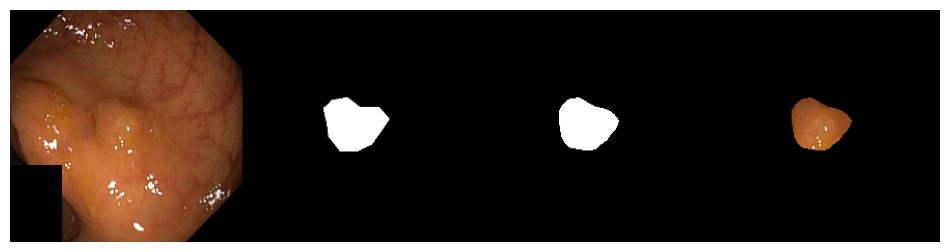

 Epoch: 42 of 100, Iter.: 75 of 75, Train Loss: 0.019040, IoU: 0.975288, Dice: 0.987387
 Epoch: 42 of 100, Iter.: 75 of 75, Valid Loss: 0.439769, IoU: 0.807267, Dice: 0.875302


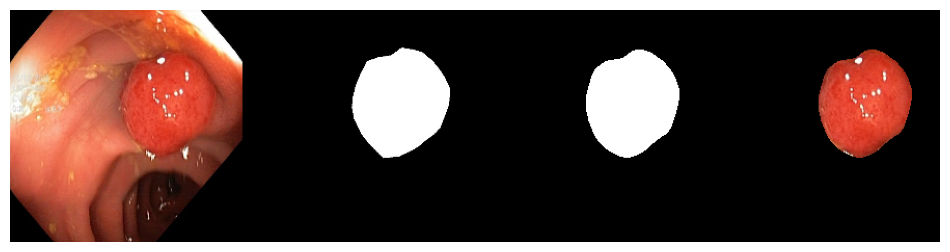

 Epoch: 43 of 100, Iter.: 75 of 75, Train Loss: 0.018775, IoU: 0.975821, Dice: 0.987670
 Epoch: 43 of 100, Iter.: 75 of 75, Valid Loss: 0.442604, IoU: 0.806763, Dice: 0.873470


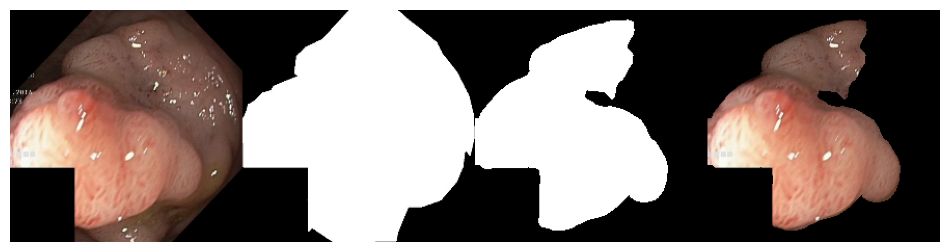

 Epoch: 44 of 100, Iter.: 75 of 75, Train Loss: 0.018342, IoU: 0.975870, Dice: 0.987683
 Epoch: 44 of 100, Iter.: 75 of 75, Valid Loss: 0.454495, IoU: 0.811689, Dice: 0.880140


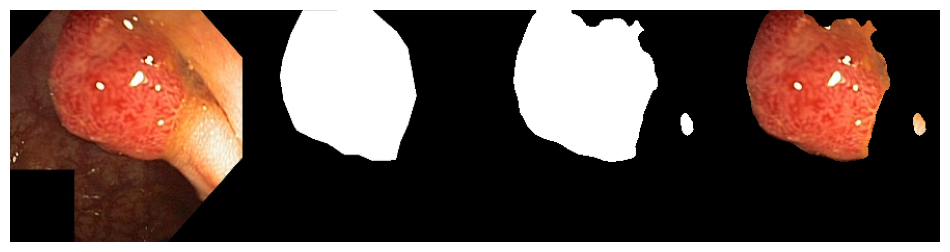

 Epoch: 45 of 100, Iter.: 75 of 75, Train Loss: 0.018125, IoU: 0.976541, Dice: 0.988044
 Epoch: 45 of 100, Iter.: 75 of 75, Valid Loss: 0.463620, IoU: 0.809536, Dice: 0.877679


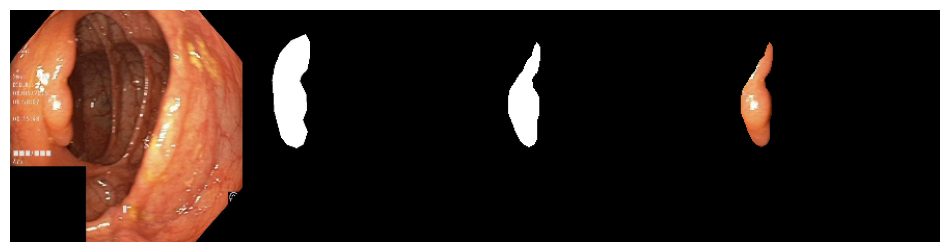

 Epoch: 46 of 100, Iter.: 75 of 75, Train Loss: 0.017648, IoU: 0.976864, Dice: 0.988180
 Epoch: 46 of 100, Iter.: 75 of 75, Valid Loss: 0.458299, IoU: 0.810692, Dice: 0.877262


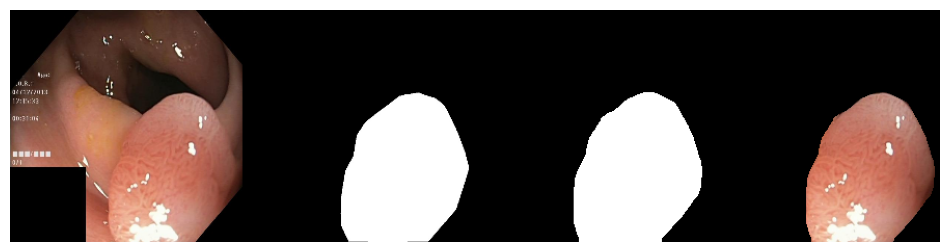

 Epoch: 47 of 100, Iter.: 75 of 75, Train Loss: 0.017571, IoU: 0.977352, Dice: 0.988477
 Epoch: 47 of 100, Iter.: 75 of 75, Valid Loss: 0.462183, IoU: 0.809120, Dice: 0.875151


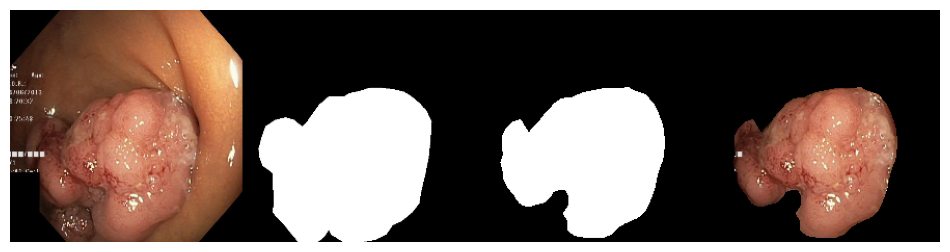

 Epoch: 48 of 100, Iter.: 75 of 75, Train Loss: 0.018216, IoU: 0.975690, Dice: 0.987541
 Epoch: 48 of 100, Iter.: 75 of 75, Valid Loss: 0.468618, IoU: 0.807235, Dice: 0.873645


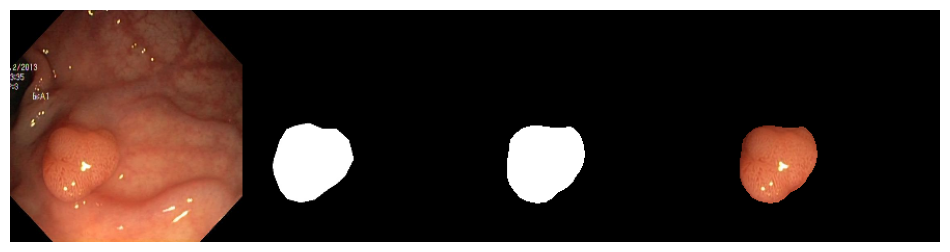

 Epoch: 49 of 100, Iter.: 75 of 75, Train Loss: 0.017878, IoU: 0.976177, Dice: 0.987852
 Epoch: 49 of 100, Iter.: 75 of 75, Valid Loss: 0.469565, IoU: 0.807746, Dice: 0.873917


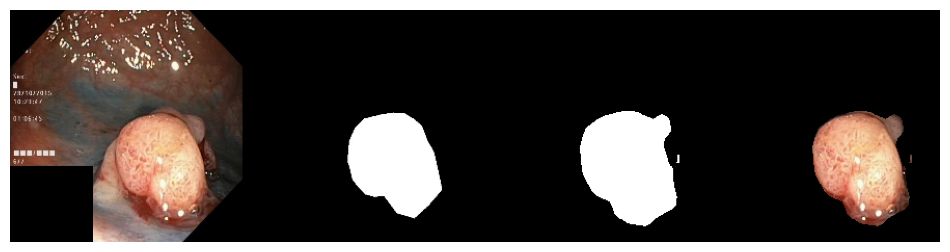

 Epoch: 50 of 100, Iter.: 75 of 75, Train Loss: 0.017398, IoU: 0.976737, Dice: 0.988128
 Epoch: 50 of 100, Iter.: 75 of 75, Valid Loss: 0.475461, IoU: 0.811204, Dice: 0.878189


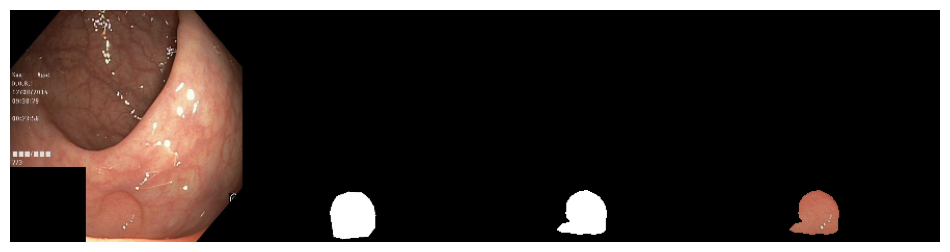

 Epoch: 51 of 100, Iter.: 75 of 75, Train Loss: 0.017152, IoU: 0.977005, Dice: 0.988298
 Epoch: 51 of 100, Iter.: 75 of 75, Valid Loss: 0.477616, IoU: 0.808746, Dice: 0.874643


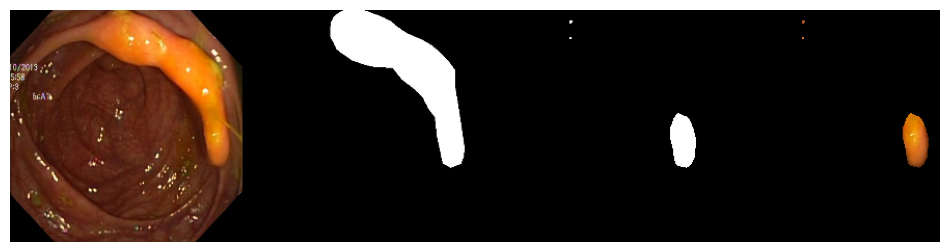

 Epoch: 52 of 100, Iter.: 75 of 75, Train Loss: 0.016508, IoU: 0.978190, Dice: 0.988910
 Epoch: 52 of 100, Iter.: 75 of 75, Valid Loss: 0.494819, IoU: 0.805450, Dice: 0.872139


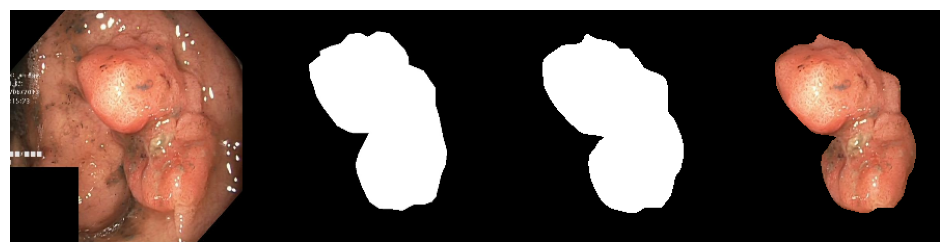

 Epoch: 53 of 100, Iter.: 75 of 75, Train Loss: 0.016198, IoU: 0.978757, Dice: 0.989196
 Epoch: 53 of 100, Iter.: 75 of 75, Valid Loss: 0.479713, IoU: 0.809262, Dice: 0.874764


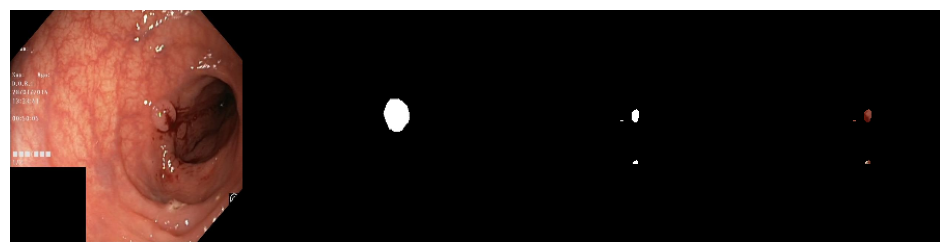

 Epoch: 54 of 100, Iter.: 75 of 75, Train Loss: 0.016012, IoU: 0.978322, Dice: 0.988927
 Epoch: 54 of 100, Iter.: 75 of 75, Valid Loss: 0.515382, IoU: 0.805339, Dice: 0.872732


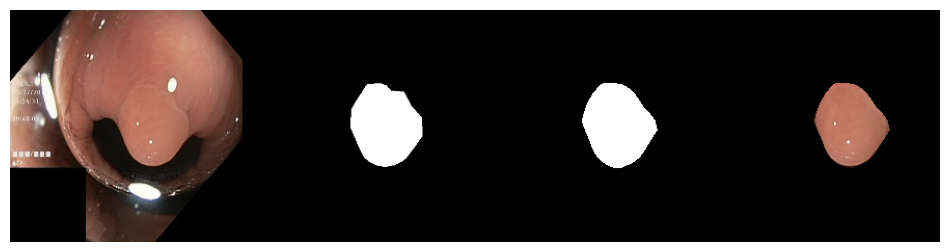

 Epoch: 55 of 100, Iter.: 75 of 75, Train Loss: 0.015898, IoU: 0.979227, Dice: 0.989444
 Epoch: 55 of 100, Iter.: 75 of 75, Valid Loss: 0.499660, IoU: 0.807292, Dice: 0.874038


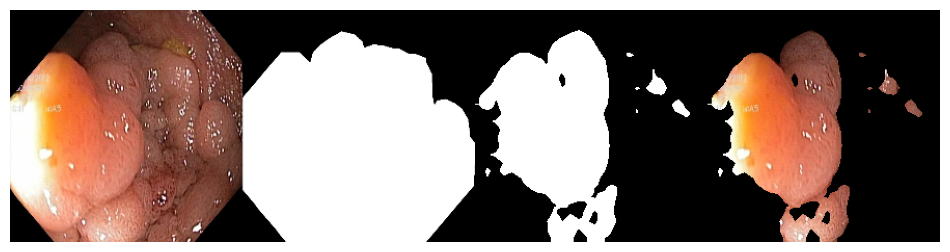

 Epoch: 56 of 100, Iter.: 75 of 75, Train Loss: 0.016086, IoU: 0.978809, Dice: 0.989228
 Epoch: 56 of 100, Iter.: 75 of 75, Valid Loss: 0.506924, IoU: 0.811145, Dice: 0.876943


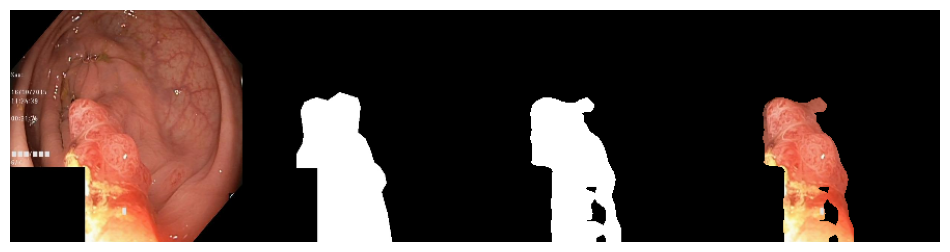

 Epoch: 57 of 100, Iter.: 75 of 75, Train Loss: 0.015864, IoU: 0.978387, Dice: 0.988988
 Epoch: 57 of 100, Iter.: 75 of 75, Valid Loss: 0.508850, IoU: 0.810608, Dice: 0.877525


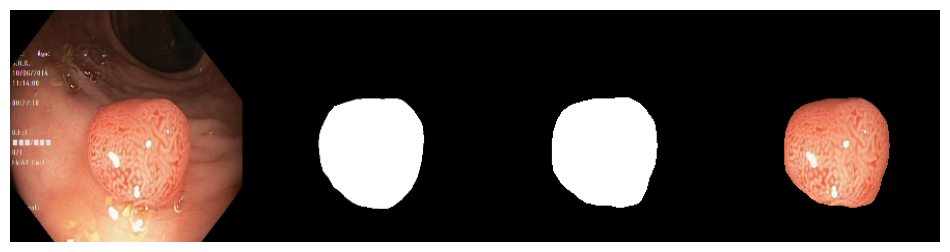

 Epoch: 58 of 100, Iter.: 75 of 75, Train Loss: 0.015270, IoU: 0.979436, Dice: 0.989531
 Epoch: 58 of 100, Iter.: 75 of 75, Valid Loss: 0.519098, IoU: 0.809198, Dice: 0.875644


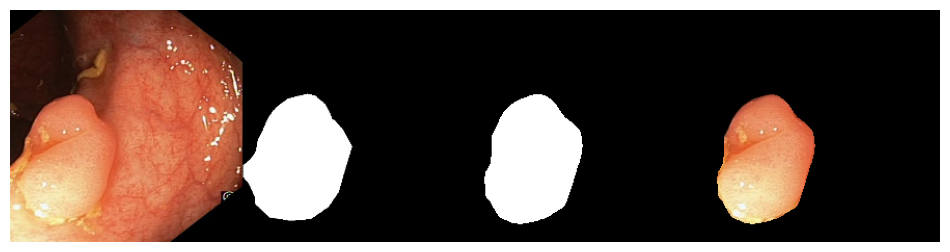

 Epoch: 59 of 100, Iter.: 75 of 75, Train Loss: 0.014861, IoU: 0.980278, Dice: 0.989958
 Epoch: 59 of 100, Iter.: 75 of 75, Valid Loss: 0.533392, IoU: 0.812528, Dice: 0.879290


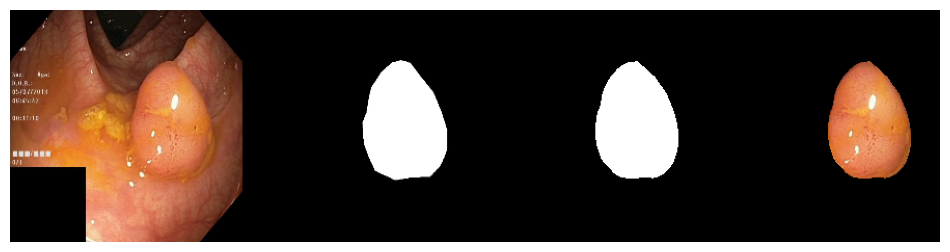

 Epoch: 60 of 100, Iter.: 75 of 75, Train Loss: 0.014923, IoU: 0.980069, Dice: 0.989831
 Epoch: 60 of 100, Iter.: 75 of 75, Valid Loss: 0.526807, IoU: 0.811746, Dice: 0.879551


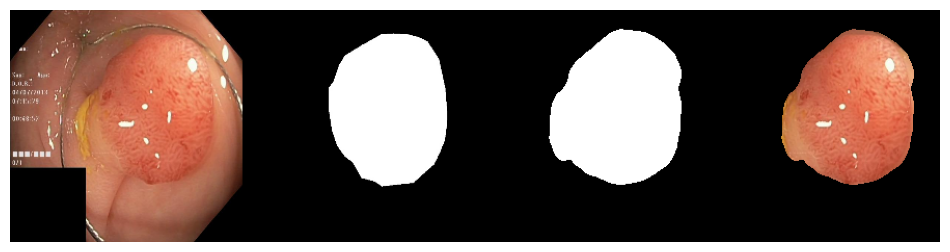

 Epoch: 61 of 100, Iter.: 75 of 75, Train Loss: 0.014757, IoU: 0.980244, Dice: 0.989951
 Epoch: 61 of 100, Iter.: 75 of 75, Valid Loss: 0.529577, IoU: 0.809607, Dice: 0.876103


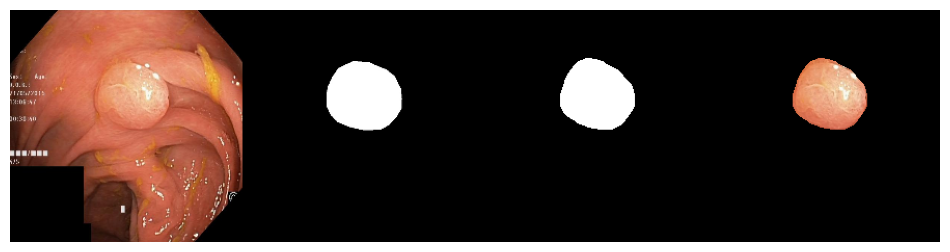

 Epoch: 62 of 100, Iter.: 75 of 75, Train Loss: 0.014871, IoU: 0.979830, Dice: 0.989736
 Epoch: 62 of 100, Iter.: 75 of 75, Valid Loss: 0.530929, IoU: 0.813763, Dice: 0.880372


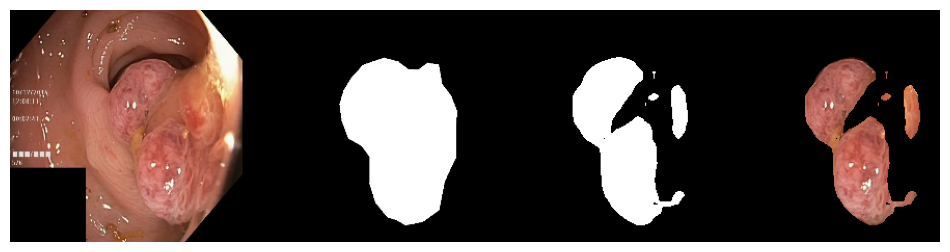

 Epoch: 63 of 100, Iter.: 75 of 75, Train Loss: 0.077334, IoU: 0.937484, Dice: 0.961563
 Epoch: 63 of 100, Iter.: 75 of 75, Valid Loss: 4.398214, IoU: 0.269973, Dice: 0.399656


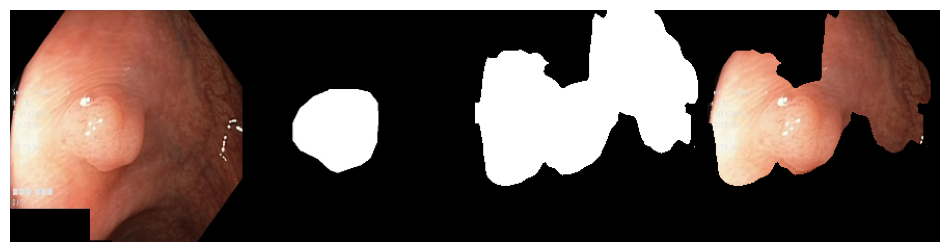

 Epoch: 64 of 100, Iter.: 75 of 75, Train Loss: 0.383553, IoU: 0.716293, Dice: 0.804287
 Epoch: 64 of 100, Iter.: 75 of 75, Valid Loss: 0.605045, IoU: 0.586485, Dice: 0.675812


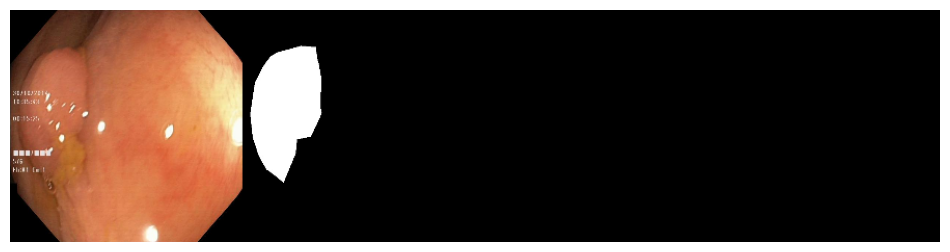

 Epoch: 65 of 100, Iter.: 75 of 75, Train Loss: 0.215938, IoU: 0.824606, Dice: 0.887552
 Epoch: 65 of 100, Iter.: 75 of 75, Valid Loss: 0.361387, IoU: 0.753293, Dice: 0.826709


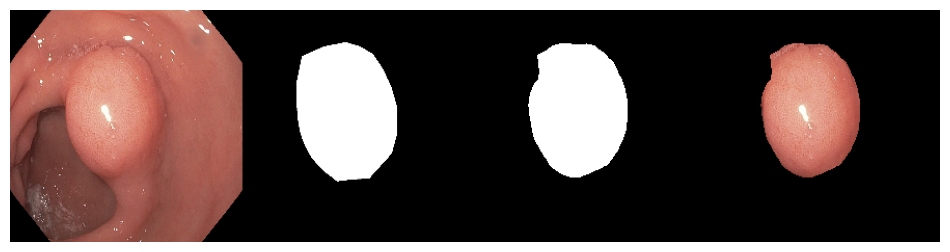

 Epoch: 66 of 100, Iter.: 75 of 75, Train Loss: 0.115188, IoU: 0.885990, Dice: 0.934247
 Epoch: 66 of 100, Iter.: 75 of 75, Valid Loss: 0.367920, IoU: 0.767526, Dice: 0.843036


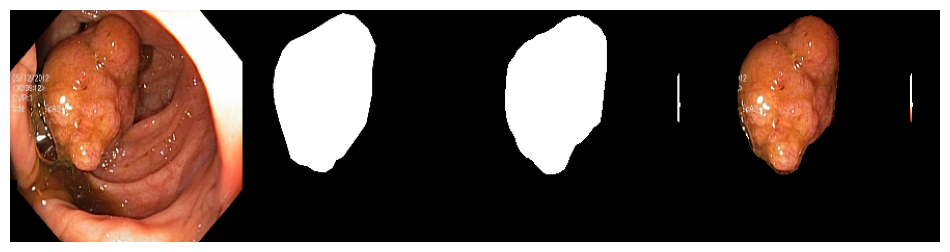

 Epoch: 67 of 100, Iter.: 75 of 75, Train Loss: 0.090667, IoU: 0.907580, Dice: 0.948638
 Epoch: 67 of 100, Iter.: 75 of 75, Valid Loss: 0.329675, IoU: 0.791180, Dice: 0.861495


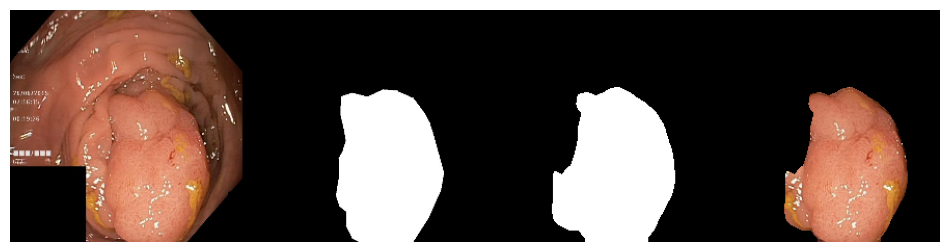

 Epoch: 68 of 100, Iter.: 75 of 75, Train Loss: 0.060274, IoU: 0.930130, Dice: 0.962200
 Epoch: 68 of 100, Iter.: 75 of 75, Valid Loss: 0.330597, IoU: 0.801977, Dice: 0.868050


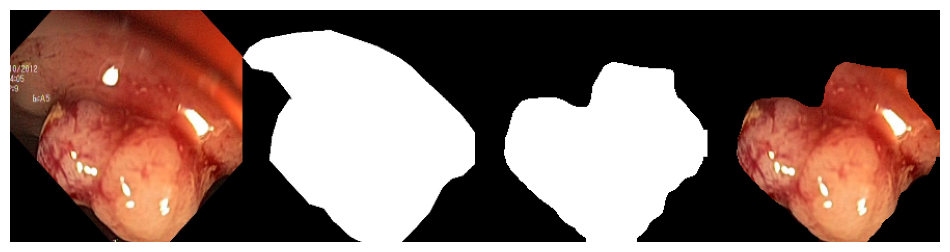

 Epoch: 69 of 100, Iter.: 75 of 75, Train Loss: 0.047705, IoU: 0.941719, Dice: 0.969295
 Epoch: 69 of 100, Iter.: 75 of 75, Valid Loss: 0.338062, IoU: 0.804778, Dice: 0.869887


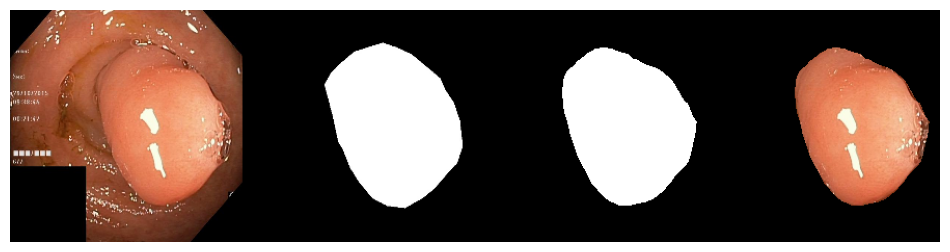

 Epoch: 70 of 100, Iter.: 75 of 75, Train Loss: 0.040493, IoU: 0.950095, Dice: 0.973280
 Epoch: 70 of 100, Iter.: 75 of 75, Valid Loss: 0.356164, IoU: 0.803935, Dice: 0.869507


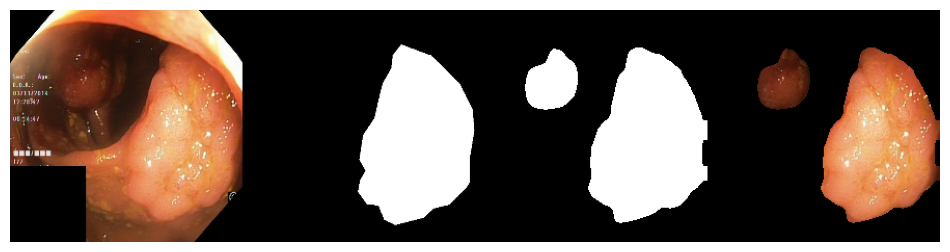

 Epoch: 71 of 100, Iter.: 75 of 75, Train Loss: 0.034238, IoU: 0.957342, Dice: 0.977836
 Epoch: 71 of 100, Iter.: 75 of 75, Valid Loss: 0.380704, IoU: 0.802701, Dice: 0.868333


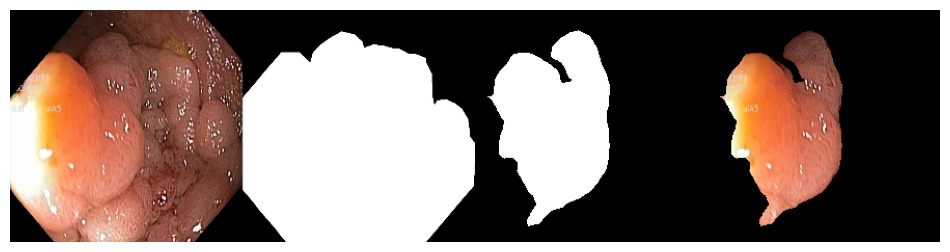

 Epoch: 72 of 100, Iter.: 75 of 75, Train Loss: 0.030876, IoU: 0.960791, Dice: 0.979652
 Epoch: 72 of 100, Iter.: 75 of 75, Valid Loss: 0.394877, IoU: 0.801345, Dice: 0.868402


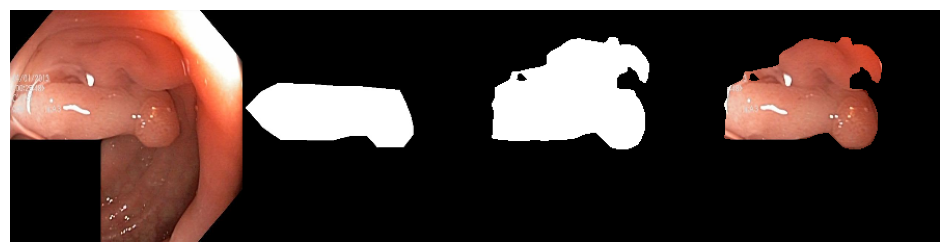

 Epoch: 73 of 100, Iter.: 75 of 75, Train Loss: 0.026903, IoU: 0.965159, Dice: 0.982045
 Epoch: 73 of 100, Iter.: 75 of 75, Valid Loss: 0.410183, IoU: 0.803404, Dice: 0.869801


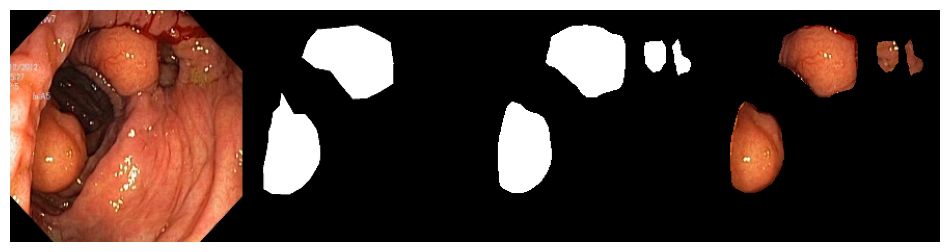

 Epoch: 74 of 100, Iter.: 75 of 75, Train Loss: 0.024096, IoU: 0.968545, Dice: 0.983839
 Epoch: 74 of 100, Iter.: 75 of 75, Valid Loss: 0.425761, IoU: 0.803074, Dice: 0.868985


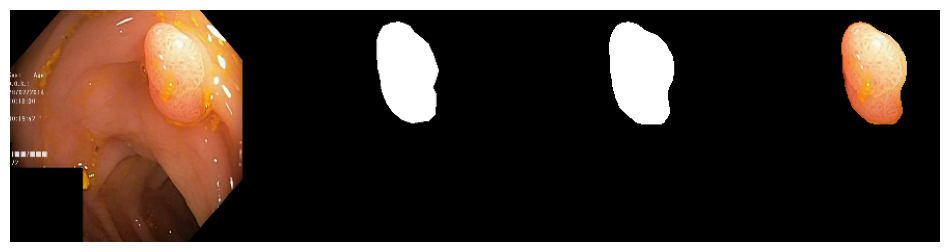

 Epoch: 75 of 100, Iter.: 75 of 75, Train Loss: 0.021741, IoU: 0.971372, Dice: 0.985345
 Epoch: 75 of 100, Iter.: 75 of 75, Valid Loss: 0.448568, IoU: 0.801862, Dice: 0.868215


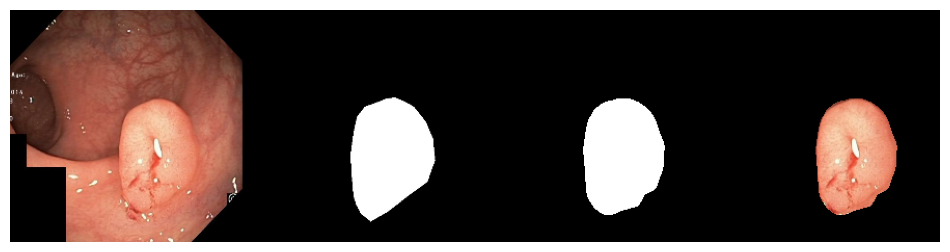

 Epoch: 76 of 100, Iter.: 75 of 75, Train Loss: 0.020362, IoU: 0.973277, Dice: 0.986295
 Epoch: 76 of 100, Iter.: 75 of 75, Valid Loss: 0.467480, IoU: 0.800683, Dice: 0.867800


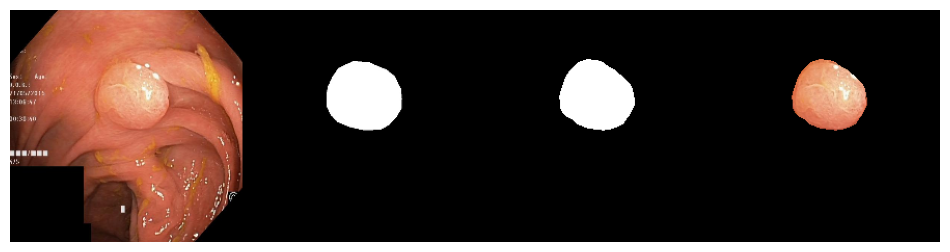

 Epoch: 77 of 100, Iter.: 75 of 75, Train Loss: 0.019475, IoU: 0.974350, Dice: 0.986882
 Epoch: 77 of 100, Iter.: 75 of 75, Valid Loss: 0.472801, IoU: 0.804003, Dice: 0.870302


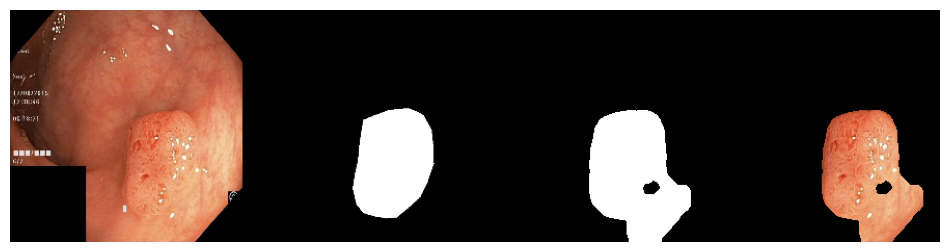

 Epoch: 78 of 100, Iter.: 75 of 75, Train Loss: 0.019022, IoU: 0.974727, Dice: 0.987071
 Epoch: 78 of 100, Iter.: 75 of 75, Valid Loss: 0.472719, IoU: 0.803186, Dice: 0.869250


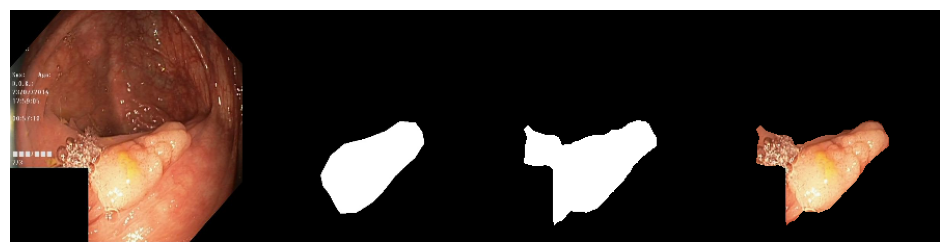

 Epoch: 79 of 100, Iter.: 75 of 75, Train Loss: 0.018777, IoU: 0.975261, Dice: 0.987349
 Epoch: 79 of 100, Iter.: 75 of 75, Valid Loss: 0.501950, IoU: 0.803858, Dice: 0.871435


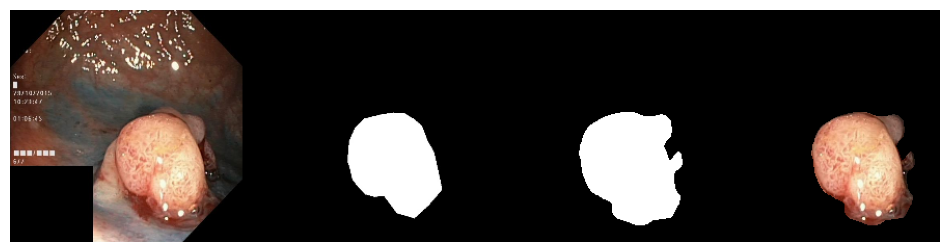

 Epoch: 80 of 100, Iter.: 75 of 75, Train Loss: 0.037923, IoU: 0.959012, Dice: 0.978033
 Epoch: 80 of 100, Iter.: 75 of 75, Valid Loss: 0.534097, IoU: 0.788115, Dice: 0.860973


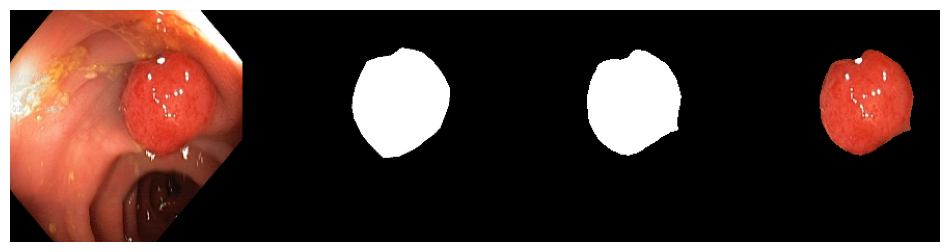

 Epoch: 81 of 100, Iter.: 75 of 75, Train Loss: 0.081442, IoU: 0.921994, Dice: 0.956016
 Epoch: 81 of 100, Iter.: 75 of 75, Valid Loss: 0.628821, IoU: 0.695888, Dice: 0.777763


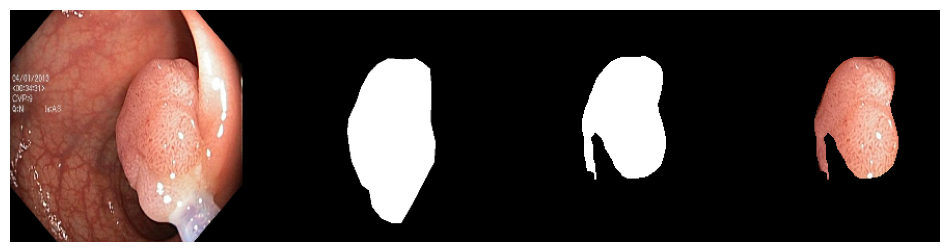

 Epoch: 82 of 100, Iter.: 75 of 75, Train Loss: 0.084295, IoU: 0.915390, Dice: 0.952468
 Epoch: 82 of 100, Iter.: 75 of 75, Valid Loss: 0.380716, IoU: 0.767201, Dice: 0.837053


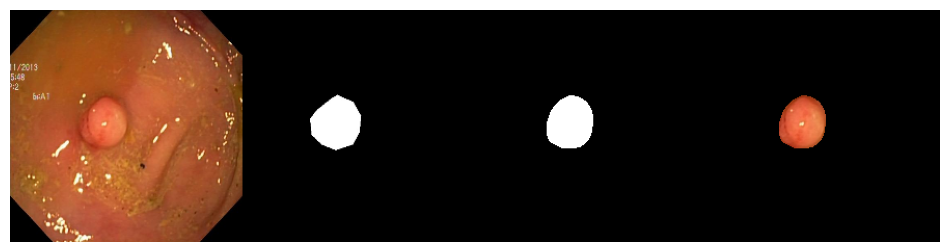

 Epoch: 83 of 100, Iter.: 75 of 75, Train Loss: 0.042321, IoU: 0.949077, Dice: 0.973289
 Epoch: 83 of 100, Iter.: 75 of 75, Valid Loss: 0.393939, IoU: 0.787127, Dice: 0.855508


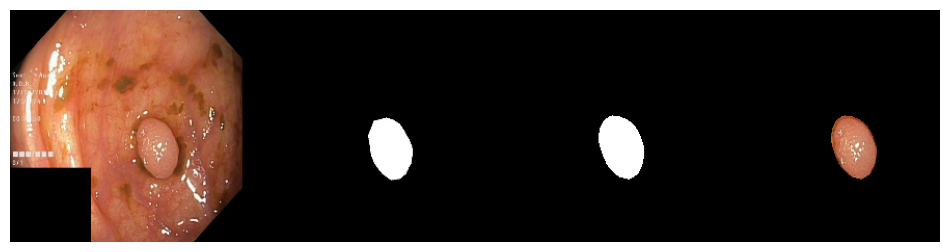


Early stopping. Target criteria has not improved for 20 epochs.

CPU times: user 18min 27s, sys: 12min 19s, total: 30min 47s
Wall time: 24min 9s


In [11]:

%%time
from ploting import plot_model_prediction

train_losses, val_losses = [], []
train_ious, val_ious = [], []
train_dices, val_dices = [], []
best_iou, best_dice, best_loss = 0, 0, np.inf
best_epoch_dice = -1
state = {}
lst_epoch_metric = []

start_time = time.time()
for epoch in range(1, epochs+1):
    running_loss, running_iou, running_dice = 0, 0, 0

    # Train
    model.train()
    for i, (imgs, masks) in enumerate(dataloader_train):
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        
        prediction = model(imgs)
        
        optimizer.zero_grad()
        loss = criterion(prediction, masks)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        running_iou += iou_pytorch_eval(prediction, masks)
        running_dice += dice_pytorch_eval(prediction, masks)
        print("\r Epoch: {} of {}, Iter.: {} of {}, Loss: {:.6f}, IoU:  {:.6f},  Dice:  {:.6f}".format(epoch, epochs, i, len(dataloader_train), running_loss/(i+1), running_iou/(i+1), running_dice/(i+1)), end="")
        
    # Validate
    model.eval()
    val_loss, val_iou, val_dice = 0, 0, 0
    for i, (imgs, masks) in enumerate(dataloader_val):
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        
        prediction = model(imgs)
        loss = criterion(prediction, masks)
        val_loss += loss.item()
        print("\r Epoch: {} of {}, Iter.: {} of {}, Loss: {:.6f}, Val. Loss: {:.6f}".format(epoch, epochs, len(dataloader_train), len(dataloader_train), running_loss/len(dataloader_train), val_loss/(i+1)), end="")
        
        val_iou += iou_pytorch_eval(prediction, masks)
        print("\r Epoch: {} of {}, Iter.: {} of {}, IoU: {:.6f}, Val. IoU: {:.6f}".format(epoch, epochs, len(dataloader_train), len(dataloader_train), running_iou/len(dataloader_train), val_iou/(i+1)), end="")

        val_dice += dice_pytorch_eval(prediction, masks)
        print("\r Epoch: {} of {}, Iter.: {} of {}, Dice: {:.6f}, Val. Dice: {:.6f}".format(epoch, epochs, len(dataloader_train), len(dataloader_train), running_dice/len(dataloader_train), val_dice/(i+1)), end="")
    
    
    # compute overall epoch losses
    epoch_train_loss = running_loss/len(dataloader_train)
    train_losses.append(epoch_train_loss)
    epoch_val_loss = val_loss/len(dataloader_val)
    val_losses.append(epoch_val_loss)

    # compute overall epoch iou-s
    epoch_train_iou = (running_iou/len(dataloader_train)).item()
    train_ious.append(epoch_train_iou)
    epoch_val_iou = (val_iou/len(dataloader_val)).item()
    val_ious.append(epoch_val_iou)
    
    # compute overall epoch dice
    epoch_train_dice = (running_dice/len(dataloader_train)).item()
    train_dices.append(epoch_train_dice)
    epoch_val_dice = (val_dice/len(dataloader_val)).item()
    val_dices.append(epoch_val_dice)

    print("\r Epoch: {} of {}, Iter.: {} of {}, Train Loss: {:.6f}, IoU: {:.6f}, Dice: {:.6f}".format(epoch, epochs, len(dataloader_train), len(dataloader_train), epoch_train_loss, epoch_train_iou, epoch_train_dice))
    print("\r Epoch: {} of {}, Iter.: {} of {}, Valid Loss: {:.6f}, IoU: {:.6f}, Dice: {:.6f}".format(epoch, epochs, len(dataloader_train), len(dataloader_train), epoch_val_loss, epoch_val_iou, epoch_val_dice))
    if epoch == 1:
        print('\n시각화되는 이미지는 1.실제 테스트 이미지 2.실제 라벨 이미지 3.예측 라벨 4.예측한 이미지 결과의 순서입니다.')
    plot_model_prediction(model, DEVICE, valid_images, valid_labels)
        
    # plot
    metrics = {'loss':[train_losses, epoch_train_loss, val_losses, epoch_val_loss],
               'Iou':[train_ious, epoch_train_iou, val_ious,  epoch_val_iou],
               'Dice':[train_dices, epoch_train_dice, val_dices,  epoch_val_dice]}
    
    lst_epoch_metric.append([round(epoch_train_loss,4), round(epoch_train_iou,4), round(epoch_train_dice,4), 
                             round(epoch_val_loss,4), round(epoch_val_iou,4), round(epoch_val_dice,4)]) 

    # save if best results or break is has not improved for {patience} number of epochs
    best_iou = max(best_iou, epoch_val_iou)
    best_dice = max(best_dice, epoch_val_dice)
    best_loss = min(best_loss, epoch_val_loss)
    best_epoch_dice = epoch if best_dice == epoch_val_dice else best_epoch_dice

    # record losses
    state['train_losses'] = train_losses
    state['val_losses'] = val_losses
    
    if best_epoch_dice == epoch:
        # print('Saving..')
        state['net'] = model.state_dict()
        state['dice'] = best_dice
        state['epoch'] = epoch
            
        if not os.path.isdir('checkpoints'):
            os.mkdir('checkpoints')
        torch.save(state, f'./checkpoints/ckpt_{model_name}_{data_name}.pth')
    
    
    elif best_epoch_dice + patience < epoch:
        print(f"\nEarly stopping. Target criteria has not improved for {patience} epochs.\n")
        break

file_name = f'{model_name}_{data_name}'
# load once more and write all the losses down (othw can miss the last 10)
end_time = time.time() - start_time

state = torch.load(f'./checkpoints/ckpt_{model_name}_{data_name}.pth')
state['train_losses'] = train_losses
state['val_losses'] = val_losses
torch.save(state, f'./checkpoints/ckpt_{model_name}_{data_name}.pth')

df_epoch_metric = pd.DataFrame(lst_epoch_metric, columns = ['epoch_train_loss', 'epoch_val_loss', 'epoch_train_iou', 'epoch_val_iou', 'epoch_train_dice', 'epoch_val_dice'])
df_epoch_metric.to_csv(f'/project/segmentation/smcho1201/training_{model_name}/csv_{file_name}.csv', index_label = ['epoch'])

Validationset 기준 
Best_epoch:62, Best_IOU:0.8138, Best_DiceScore:0.8804


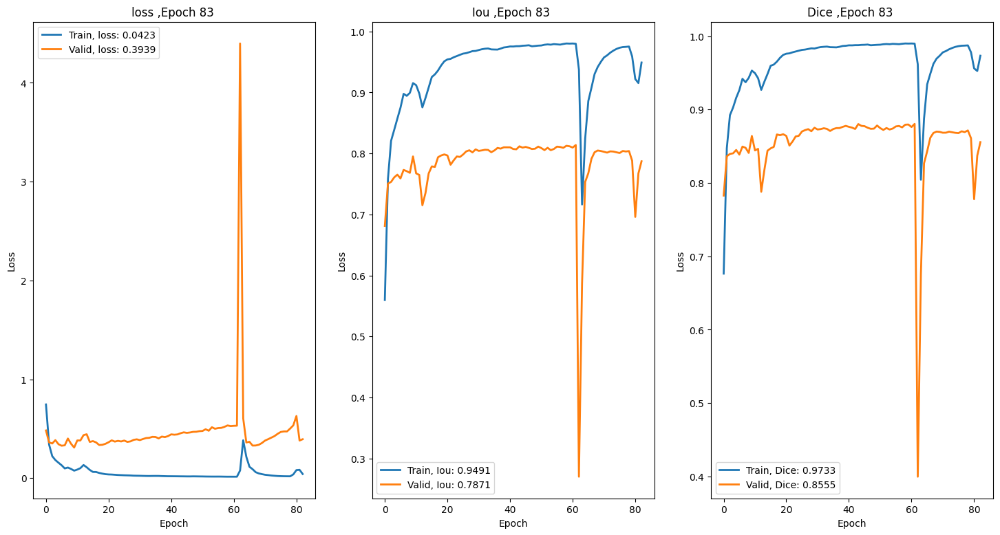

In [12]:
print(f'Validationset 기준 \nBest_epoch:{best_epoch_dice}, Best_IOU:{best_iou:.4f}, Best_DiceScore:{best_dice:.4f}')

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(18, 9))           
for i, (metric, value) in enumerate(metrics.items()):
    axs[i].plot(np.arange(len(value[0])), value[0], label=f'Train, {metric}: {value[1]:.4f}', linewidth=2)
    axs[i].plot(np.arange(len(value[2])), value[2], label=f'Valid, {metric}: {value[3]:.4f}', linewidth=2)
    axs[i].set_xlabel('Epoch')
    axs[i].set_ylabel('Loss')
    axs[i].set_title(f'{metric} ,Epoch {epoch} ')
    axs[i].legend(loc='best')
plt.show()